## U-Net
### Descripción
Este modelo es una red neuronal convolucional que se utiliza para segmentación de imágenes. La arquitectura de la red es simétrica, con una parte de contracción y una de expansión. La parte de contracción es una red convolucional convencional que reduce la resolución de la imagen de entrada, mientras que la parte de expansión es una red convolucional que aumenta la resolución de la imagen. La parte de expansión también tiene conexiones de salto que copian la información de la parte de contracción y la concatenan con la información de la parte de expansión. Estas conexiones de salto permiten que la red conserve información de alta resolución de la imagen de entrada.

En el contexto de segmentación de imágenes, este modelo aprende a identificar objetos específicos dentro de una imagen, como monedas, separándolos del fondo. Para esto, utiliza máscaras asociadas a cada imagen como etiquetas. Las máscaras representan la clase de cada píxel (por ejemplo, 1 para la moneda y 0 para el fondo). Durante el entrenamiento, el modelo predice una máscara para cada imagen de entrada, y la predicción se compara con la máscara real para ajustar sus pesos. Esto permite que el modelo genere segmentaciones precisas en nuevas imágenes.

La red se entrena utilizando la función de pérdida de entropía cruzada y el optimizador Adam.

### Pruebas
Vamos a realizar 2 pruebas con el modelo U-Net. En la primera prueba vamos a generar diferentes modelos reduciendo progresivamente el número de canales de las capas convolucionales tanto en encoder como en decoder, para ver como afecta a la presición del modelo, una vez teniendo un modelo que ya empiece a tener problemas de precisión vamos a realizar una segunda prueba que será ir eliminando los skip connections para ver como afecta a la precisión del modelo.

### Librerias
Vamos a usar las siguientes librerias:
- numpy: para el manejo de arreglos
- torch: para la creación del modelo
- torch.nn: para importar las capas de la red neuronal
- torch.nn.functional: para importar la función de activación ReLU
- torch.optim: para importar el optimizador Adam
- torch.utils.data: para importar la clase Dataset y DataLoader
- torchvision: para importar transformaciones de imágenes
- matplotlib.pyplot: para graficar imágenes
- torchvision.io: para leer imágenes
- os: para manipular archivos

In [1]:
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import datasets, transforms, utils
from torchvision.io import read_file, decode_jpeg, decode_png, ImageReadMode
import torchvision.transforms as T
import matplotlib.pyplot as plt
from torchvision.io import read_image
import os

### Datos
En este paso, definimos un conjunto de datos personalizado para cargar imágenes y máscaras. Las imágenes se redimensionan a 512x512 píxeles y se normalizan al rango [0,1]. Este conjunto de datos se utiliza para entrenar el modelo, procesando las imágenes en lotes a través de un DataLoader.

In [2]:
# Clase para cargar dataset para U-Net
class DatasetU_Net(Dataset):
    def __init__(self, data_dir, label_dir):
        """
        Clase Dataset para U-Net.
        :param data_dir: Directorio de las imágenes (entrenamiento o prueba).
        :param label_dir: Directorio de las máscaras correspondientes.
        """
        self.data_dir = data_dir
        self.label_dir = label_dir
        self.files = [os.path.splitext(f)[0] for f in os.listdir(data_dir)]
        self.transform = T.Resize((512, 512))

    def __len__(self):
        return len(self.files)

    def __getitem__(self, idx):
        file_name = self.files[idx]
        
        # Leer imagen
        image = read_image(os.path.join(self.data_dir, file_name + ".png"), mode=ImageReadMode.RGB)
        
        # Leer máscara
        mask = read_image(os.path.join(self.label_dir, file_name + ".png"), mode=ImageReadMode.GRAY)
        
        # Redimensionar
        image = self.transform(image)
        mask = self.transform(mask)
        
        # Normalizar y convertir a tensores
        image = torch.tensor(image, dtype=torch.float32) / 255.0
        mask = torch.tensor(mask, dtype=torch.float32) / 255.0
        mask = torch.round(mask)  # Redondear para obtener 0 o 1 en las máscaras

        return image, mask

                
# Dataset para entrenamiento
train_dataset = DatasetU_Net("images", "labels")
train_loader = DataLoader(train_dataset, batch_size=4, shuffle=True)

# Dataset para prueba
test_dataset = DatasetU_Net("test", "labels")
test_loader = DataLoader(test_dataset, batch_size=4, shuffle=False)



### Bloques de la red
Ahora vamos a definir los bloques de la red. La red U-Net consta de dos partes: un codificador y un decodificador. El codificador reduce la resolución de la imagen de entrada, mientras que el decodificador aumenta la resolución de la imagen. La red también tiene conexiones de salto que copian la información de la parte de codificación y la concatenan con la información de la parte de decodificación. Estas conexiones de salto permiten que la red conserve información de alta resolución de la imagen de entrada.

In [3]:
""" Convolutional block:
    It follows a two 3x3 convolutional layer, each followed by a batch normalization and a relu activation.
"""
class conv_block(nn.Module):
    def __init__(self, in_c, out_c):
        super().__init__()

        self.conv1 = nn.Conv2d(in_c, out_c, kernel_size=3, padding=1)
        self.bn1 = nn.BatchNorm2d(out_c)

        self.conv2 = nn.Conv2d(out_c, out_c, kernel_size=3, padding=1)
        self.bn2 = nn.BatchNorm2d(out_c)

        self.relu = nn.ReLU()

    def forward(self, inputs):
        x = self.conv1(inputs)
        x = self.bn1(x)
        x = self.relu(x)

        x = self.conv2(x)
        x = self.bn2(x)
        x = self.relu(x)

        return x

""" Encoder block:
    It consists of an conv_block followed by a max pooling.
    Here the number of filters doubles and the height and width half after every block.
"""
class encoder_block(nn.Module):
    def __init__(self, in_c, out_c):
        super().__init__()

        self.conv = conv_block(in_c, out_c)
        self.pool = nn.MaxPool2d((2, 2))

    def forward(self, inputs):
        x = self.conv(inputs)
        p = self.pool(x)

        return x, p

""" Decoder block:
    The decoder block begins with a transpose convolution, followed by a concatenation with the skip
    connection from the encoder block. Next comes the conv_block.
    Here the number filters decreases by half and the height and width doubles.
"""
class decoder_block(nn.Module):
    def __init__(self, in_c, out_c):
        super().__init__()

        self.up = nn.ConvTranspose2d(in_c, out_c, kernel_size=2, stride=2, padding=0)
        self.conv = conv_block(out_c+out_c, out_c)

    def forward(self, inputs, skip):
        x = self.up(inputs)
        x = torch.cat([x, skip], axis=1)
        x = self.conv(x)

        return x

### Prueba 1 : Reducir progresivamente el número de canales de las capas convolucionales
En esta prueba vamos a generar diferentes modelos reduciendo progresivamente el número de canales de las capas convolucionales tanto en encoder como en decoder, para ver como afecta a la presición del modelo.

#### Construcción del modelo U-Net
Vamos a construir una clase adaptable para la reducción progresiva de los canales de las capas convolucionales de la red U-Net. Esta clase se puede utilizar para crear diferentes modelos reduciendo a la mitad el número de canales en cada capa convolucional.

In [4]:
# Verificar si hay GPU disponible
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Usando dispositivo: {device}")
if device.type == "cuda":
    print(f"Nombre del dispositivo GPU: {torch.cuda.get_device_name(0)}")

# Definición del modelo U-Net parametrizado
class build_unet(nn.Module):
    def __init__(self, base_channels):
        super().__init__()

        """ Encoder """
        self.e1 = encoder_block(3, base_channels)
        self.e2 = encoder_block(base_channels, base_channels * 2)
        self.e3 = encoder_block(base_channels * 2, base_channels * 4)
        self.e4 = encoder_block(base_channels * 4, base_channels * 8)

        """ Bottleneck """
        self.b = conv_block(base_channels * 8, base_channels * 16)

        """ Decoder """
        self.d1 = decoder_block(base_channels * 16, base_channels * 8)
        self.d2 = decoder_block(base_channels * 8, base_channels * 4)
        self.d3 = decoder_block(base_channels * 4, base_channels * 2)
        self.d4 = decoder_block(base_channels * 2, base_channels)

        """ Classifier """
        self.outputs = nn.Conv2d(base_channels, 1, kernel_size=1, padding=0)

    def forward(self, inputs):
        """ Encoder """
        s1, p1 = self.e1(inputs)
        s2, p2 = self.e2(p1)
        s3, p3 = self.e3(p2)
        s4, p4 = self.e4(p3)

        """ Bottleneck """
        b = self.b(p4)

        """ Decoder """
        d1 = self.d1(b, s4)
        d2 = self.d2(d1, s3)
        d3 = self.d3(d2, s2)
        d4 = self.d4(d3, s1)

        """ Classifier """
        outputs = self.outputs(d4)

        return outputs

Usando dispositivo: cuda
Nombre del dispositivo GPU: NVIDIA GeForce RTX 3050 Laptop GPU


#### Entrenamiento del modelo
Vamos a entrenar el modelo U-Net con el conjunto de datos personalizado. Durante el entrenamiento, se calcula la pérdida de entropía cruzada entre las máscaras predichas y reales, y se ajustan los pesos del modelo utilizando el optimizador Adam. El modelo se entrena durante 200 épocas con un tamaño de lote de 4.

In [5]:
# Parámetros de entrenamiento
num_epochs = 200

# Mover la función de pérdida a la GPU
criterion = nn.MSELoss().to(device)

# Entrenamiento iterativo con reducción de canales
base_channels = 64  # Número inicial de canales
for i in range(3):  # Reducir a la mitad los canales hasta 3 veces
    print(f"\nEntrenando modelo {i + 1} con base_channels = {base_channels}...")

    # Crear el modelo con la configuración reducida
    model = build_unet(base_channels=base_channels).to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr=1e-3, weight_decay=1e-5)

    # Entrenamiento
    for epoch in range(num_epochs):
        for idx, (images, labels) in enumerate(train_loader):
            # Mover datos a la GPU
            images, labels = images.to(device), labels.to(device)

            # Forward pass
            outputs = model(images)
            loss = criterion(outputs, labels)
            
            # Backward pass y optimización
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

        print(f'Epoch [{epoch + 1}/{num_epochs}], Loss: {loss.item():.4f}')

    # Guardar el modelo entrenado
    model_path = f"model_unet_coins_{i + 1}.pth"
    torch.save(model.state_dict(), model_path)
    print(f"Modelo guardado en {model_path}")

    # Reducir los canales a la mitad para la siguiente iteración
    base_channels //= 2




Entrenando modelo 1 con base_channels = 64...


C:\Users\Usuario\AppData\Local\Temp\ipykernel_10256\2751875161.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  image = torch.tensor(image, dtype=torch.float32) / 255.0
C:\Users\Usuario\AppData\Local\Temp\ipykernel_10256\2751875161.py:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  mask = torch.tensor(mask, dtype=torch.float32) / 255.0


Epoch [1/200], Loss: 0.3010
Epoch [2/200], Loss: 0.3879
Epoch [3/200], Loss: 0.2183
Epoch [4/200], Loss: 0.0810
Epoch [5/200], Loss: 0.0577
Epoch [6/200], Loss: 0.0434
Epoch [7/200], Loss: 0.0306
Epoch [8/200], Loss: 0.0277
Epoch [9/200], Loss: 0.0189
Epoch [10/200], Loss: 0.0163
Epoch [11/200], Loss: 0.0135
Epoch [12/200], Loss: 0.0100
Epoch [13/200], Loss: 0.0089
Epoch [14/200], Loss: 0.0095
Epoch [15/200], Loss: 0.0079
Epoch [16/200], Loss: 0.0063
Epoch [17/200], Loss: 0.0052
Epoch [18/200], Loss: 0.0050
Epoch [19/200], Loss: 0.0051
Epoch [20/200], Loss: 0.0049
Epoch [21/200], Loss: 0.0046
Epoch [22/200], Loss: 0.0043
Epoch [23/200], Loss: 0.0039
Epoch [24/200], Loss: 0.0035
Epoch [25/200], Loss: 0.0032
Epoch [26/200], Loss: 0.0032
Epoch [27/200], Loss: 0.0031
Epoch [28/200], Loss: 0.0030
Epoch [29/200], Loss: 0.0027
Epoch [30/200], Loss: 0.0025
Epoch [31/200], Loss: 0.0025
Epoch [32/200], Loss: 0.0026
Epoch [33/200], Loss: 0.0025
Epoch [34/200], Loss: 0.0024
Epoch [35/200], Loss: 0

#### Visualización de resultados
Vamos a visualizar los resultados del modelo U-Net en el conjunto de datos de prueba. Se muestran las imágenes originales, las máscaras reales y las máscaras predichas por el modelo.



Visualizando resultados del modelo 1...


C:\Users\Usuario\AppData\Local\Temp\ipykernel_10256\790913967.py:7: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path))  # Cargar los

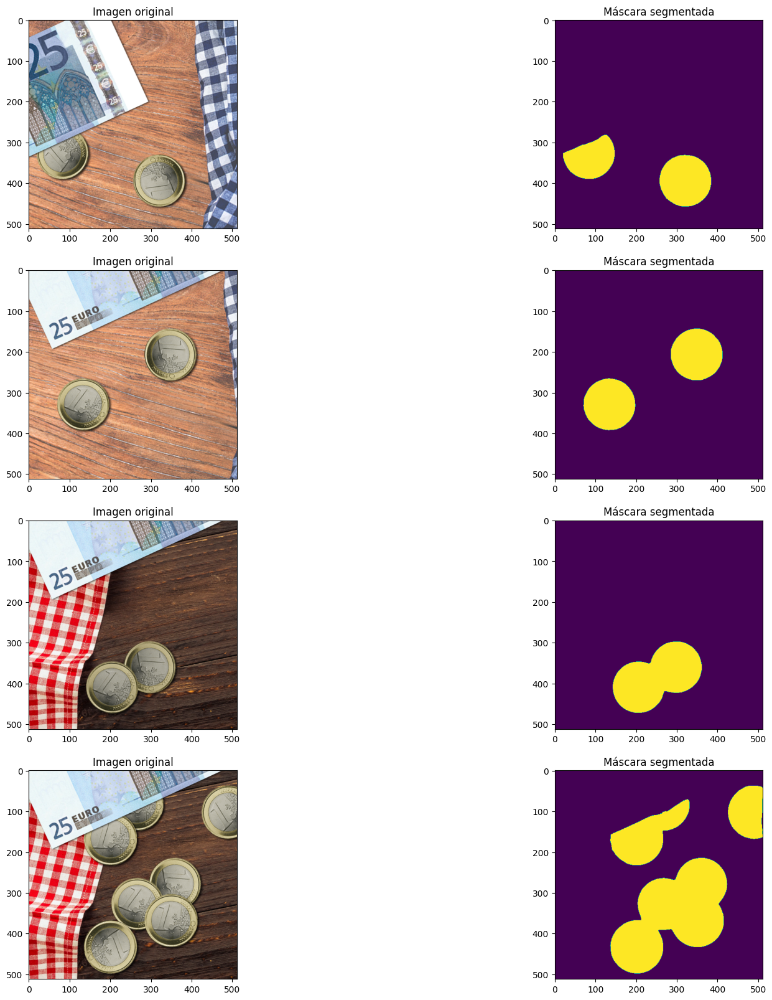


Visualizando resultados del modelo 2...


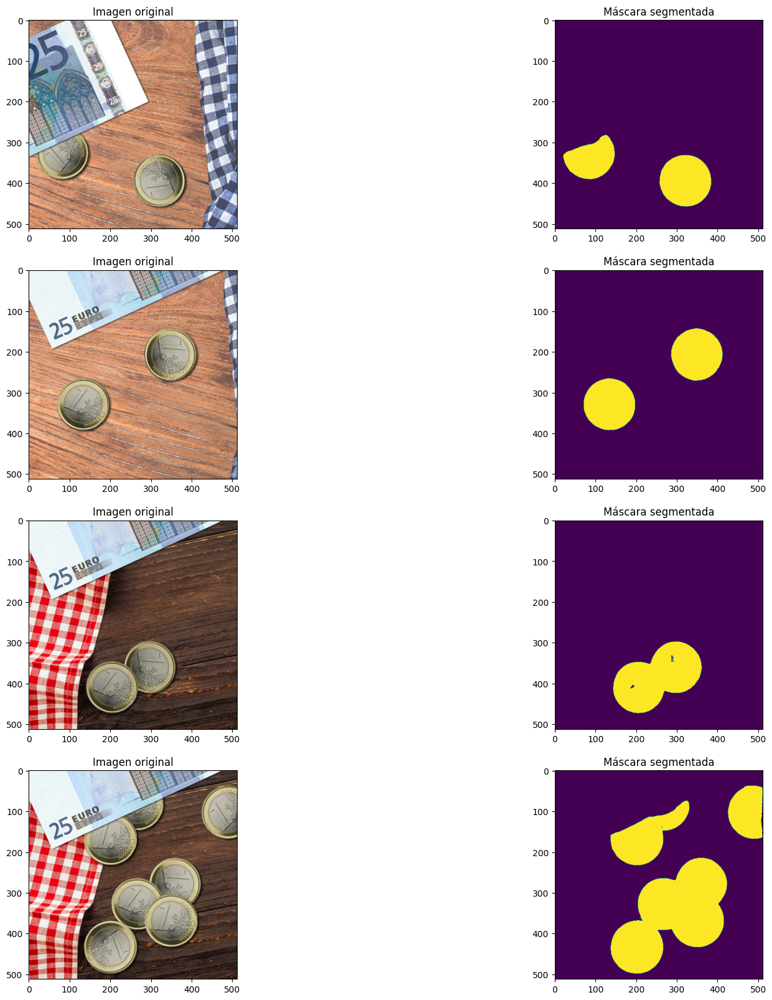


Visualizando resultados del modelo 3...


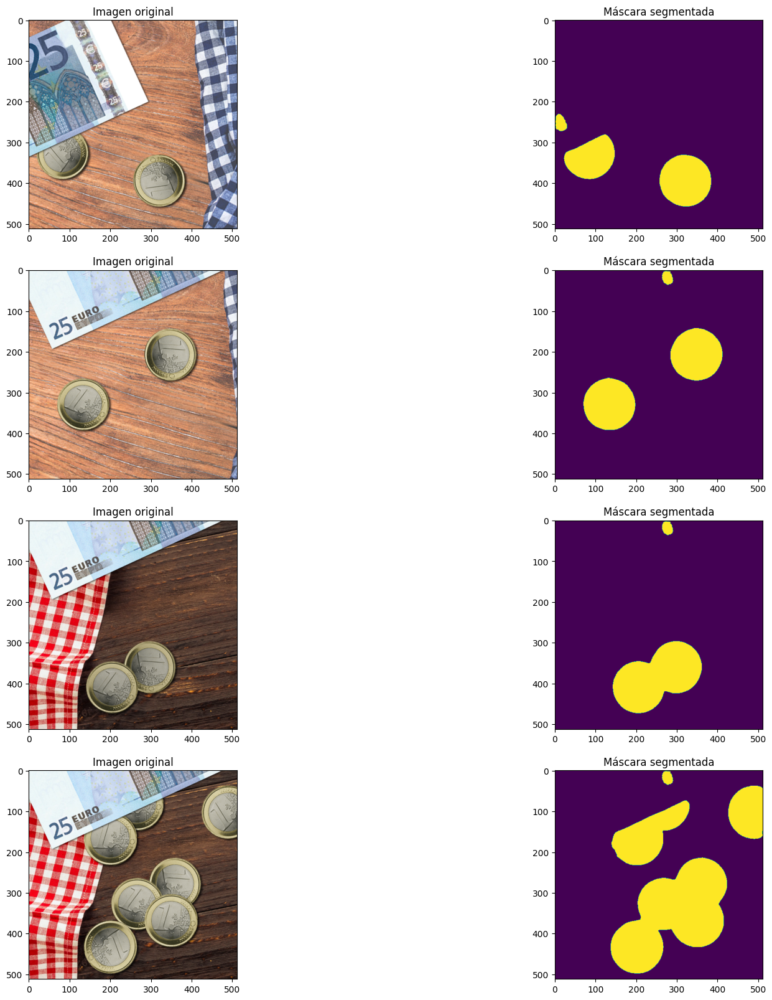

In [6]:
for i in range(3):
    print(f"\nVisualizando resultados del modelo {i + 1}...")

    # Cargar el modelo guardado
    model_path = f"model_unet_coins_{i + 1}.pth"
    model = build_unet(base_channels=64 // (2**i)).to(device)  # Cargar el modelo con los canales correspondientes
    model.load_state_dict(torch.load(model_path))  # Cargar los pesos del modelo entrenado
    model.eval()  # Modo de evaluación

    # Deshabilitar el cálculo de gradientes
    with torch.no_grad():
        # Obtener un batch del loader de prueba
        it = iter(test_loader)
        img, label = next(it)
        img = img.to(device)
        
        # Realizar la predicción
        ret = model(img)
        ret = torch.round(ret)  # Redondear para obtener 0 o 1 en las máscaras

        # Mostrar una matriz de imágenes (4x2)
        plt.figure(figsize=(20, 20))
        for j in range(4):  # Mostrar 4 ejemplos
            # Imagen original
            plt.subplot(4, 2, 2 * j + 1)
            plt.title("Imagen original")
            plt.imshow(img[j].permute(1, 2, 0).cpu().numpy())
            
            # Máscara segmentada
            plt.subplot(4, 2, 2 * j + 2)
            plt.title("Máscara segmentada")
            plt.imshow(ret[j][0].cpu().numpy(), cmap='viridis')
        plt.show()


### Prueba 2 : Eliminar las skip connections progresivamente
En esta prueba vamos a generar diferentes modelos eliminando progresivamente las skip connections de la red U-Net, para ver como afecta a la presición del modelo. Tomaremos el último modelo de la prueba 1 y eliminaremos las skip connections de la red U-Net.

#### Adaptacion de los bloques de la red
Neceistamos adaptar los bloques de la red para eliminar las skip connections. Vamos a definir una clase adaptable para la eliminación progresiva de las skip connections de la red U-Net. Esta clase se puede utilizar para crear diferentes modelos eliminando las skip connections de la red.

In [4]:
class decoder_block(nn.Module):
    def __init__(self, in_c, out_c):
        super().__init__()
        self.up = nn.ConvTranspose2d(in_c, out_c, kernel_size=2, stride=2, padding=0)
        self.conv = conv_block(out_c + out_c, out_c)  # Mantiene compatibilidad con concatenación

    def forward(self, inputs, skip):
        x = self.up(inputs)  # Upsampling
        if skip is not None:
            x = torch.cat([x, skip], axis=1)  # Concatenar si hay skip
        else:
            # Ajustar las dimensiones para evitar errores
            padding_channels = x.shape[1]  # Usar canales actuales
            dummy_skip = torch.zeros_like(x[:, :padding_channels, :, :]).to(x.device)  # Crear un tensor ficticio
            x = torch.cat([x, dummy_skip], axis=1)  # Concatenar con un tensor vacío para mantener dimensiones
        return self.conv(x)


#### Construcción del modelo U-Net
Vamos a construir una clase adaptable para la eliminación progresiva de las skip connections de la red U-Net. Esta clase se puede utilizar para crear diferentes modelos eliminando las skip connections de la red U-Net.

La eliminación de los skip se hará de forma adaptada para hacerlo por iteración y la haremos de más profunda a menos profunda, para ver como afecta a la precisión del modelo.

In [5]:
# Verificar si hay GPU disponible
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Usando dispositivo: {device}")
if device.type == "cuda":
    print(f"Nombre del dispositivo GPU: {torch.cuda.get_device_name(0)}")

class build_unet_skip(nn.Module):
    def __init__(self, base_channels, skip_connections):
        """
        Modelo U-Net con opción para eliminar progresivamente conexiones "skip".
        :param base_channels: Número inicial de canales en el encoder.
        :param skip_connections: Número de conexiones "skip" a mantener (0 a 3).
        """
        super().__init__()

        """ Encoder """
        self.e1 = encoder_block(3, base_channels)
        self.e2 = encoder_block(base_channels, base_channels * 2)
        self.e3 = encoder_block(base_channels * 2, base_channels * 4)
        self.e4 = encoder_block(base_channels * 4, base_channels * 8)

        """ Bottleneck """
        self.b = conv_block(base_channels * 8, base_channels * 16)

        """ Decoder """
        self.d1 = decoder_block(base_channels * 16, base_channels * 8)
        self.d2 = decoder_block(base_channels * 8, base_channels * 4)
        self.d3 = decoder_block(base_channels * 4, base_channels * 2)
        self.d4 = decoder_block(base_channels * 2, base_channels)

        """ Classifier """
        self.outputs = nn.Conv2d(base_channels, 1, kernel_size=1, padding=0)

        """ Configuración de conexiones "skip" """
        self.skip_connections = skip_connections

    def forward(self, inputs):
        """ Encoder """
        s1, p1 = self.e1(inputs)
        s2, p2 = self.e2(p1)
        s3, p3 = self.e3(p2)
        s4, p4 = self.e4(p3)

        """ Bottleneck """
        b = self.b(p4)

        """ Decoder """
        # Eliminar conexiones "skip" desde abajo hacia arriba
        d1 = self.d1(b, s4 if self.skip_connections >= 1 else None)
        d2 = self.d2(d1, s3 if self.skip_connections >= 2 else None)
        d3 = self.d3(d2, s2 if self.skip_connections >= 3 else None)
        d4 = self.d4(d3, s1 if self.skip_connections >= 4 else None)

        """ Classifier """
        outputs = self.outputs(d4)

        return outputs


Usando dispositivo: cpu


#### Entrenamiento del modelo U-Net sin skip connections
Vamos a entrenar el modelo U-Net quitando skips de forma progresiva. Durante el entrenamiento, se calcula la pérdida de entropía cruzada entre las máscaras predichas y reales, y se ajustan los pesos del modelo utilizando el optimizador Adam. El modelo se entrena durante 200 épocas con un tamaño de lote de 4.

In [6]:
# Parámetros de entrenamiento
num_epochs = 200
base_channels = 16
criterion = nn.MSELoss()

# Configuraciones de conexiones "skip" a probar (desde abajo hacia arriba)
skip_configurations = [3, 2, 1, 0]  # Números de "skip" a mantener

for skip_level in skip_configurations:
    print(f"\nEntrenando modelo con {skip_level} conexiones 'skip'...")

    # Crear modelo con la configuración actual de "skip"
    model = build_unet_skip(base_channels=base_channels, skip_connections=skip_level).to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr=1e-3, weight_decay=1e-5)

    # Entrenamiento
    for epoch in range(num_epochs):
        for idx, (images, labels) in enumerate(train_loader):
            # Forward pass
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            
            # Backward pass y optimización
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

        print(f'Epoch [{epoch + 1}/{num_epochs}], Loss: {loss.item():.4f}')

    # Guardar el modelo entrenado
    model_path = f"model_unet_skip_{skip_level}.pth"
    torch.save(model.state_dict(), model_path)
    print(f"Modelo guardado en {model_path}")



Entrenando modelo con 3 conexiones 'skip'...


C:\Users\Usuario\AppData\Local\Temp\ipykernel_23236\2751875161.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  image = torch.tensor(image, dtype=torch.float32) / 255.0
C:\Users\Usuario\AppData\Local\Temp\ipykernel_23236\2751875161.py:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  mask = torch.tensor(mask, dtype=torch.float32) / 255.0


Epoch [1/200], Loss: 0.2586
Epoch [2/200], Loss: 0.1865
Epoch [3/200], Loss: 0.1360
Epoch [4/200], Loss: 0.0984
Epoch [5/200], Loss: 0.0709
Epoch [6/200], Loss: 0.0503
Epoch [7/200], Loss: 0.0374
Epoch [8/200], Loss: 0.0285
Epoch [9/200], Loss: 0.0223
Epoch [10/200], Loss: 0.0200
Epoch [11/200], Loss: 0.0170
Epoch [12/200], Loss: 0.0128
Epoch [13/200], Loss: 0.0116
Epoch [14/200], Loss: 0.0091
Epoch [15/200], Loss: 0.0080
Epoch [16/200], Loss: 0.0073
Epoch [17/200], Loss: 0.0066
Epoch [18/200], Loss: 0.0067
Epoch [19/200], Loss: 0.0061
Epoch [20/200], Loss: 0.0057
Epoch [21/200], Loss: 0.0055
Epoch [22/200], Loss: 0.0049
Epoch [23/200], Loss: 0.0045
Epoch [24/200], Loss: 0.0041
Epoch [25/200], Loss: 0.0039
Epoch [26/200], Loss: 0.0037
Epoch [27/200], Loss: 0.0035
Epoch [28/200], Loss: 0.0034
Epoch [29/200], Loss: 0.0032
Epoch [30/200], Loss: 0.0031
Epoch [31/200], Loss: 0.0030
Epoch [32/200], Loss: 0.0030
Epoch [33/200], Loss: 0.0029
Epoch [34/200], Loss: 0.0028
Epoch [35/200], Loss: 0

#### Visualización de resultados
Vamos a visualizar los resultados del modelo U-Net sin skip connections en el conjunto de datos de prueba. Se muestran las imágenes originales, las máscaras reales y las máscaras predichas por el modelo.


Visualizando resultados del modelo con 3 conexiones 'skip'...


C:\Users\Usuario\AppData\Local\Temp\ipykernel_23236\2023521022.py:8: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path))
C:\Users\Usu

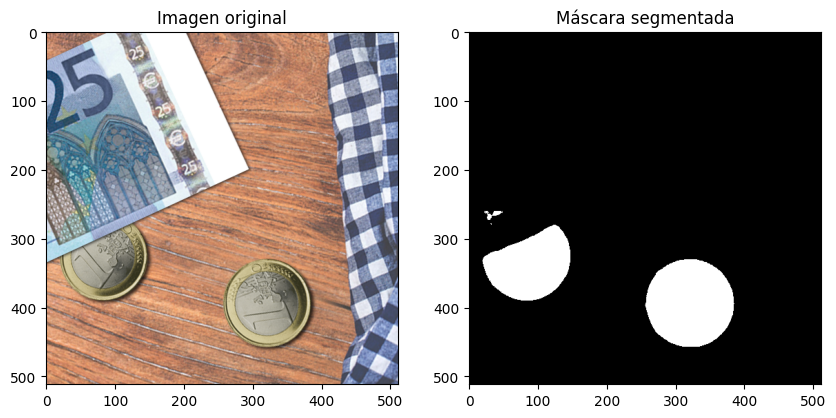

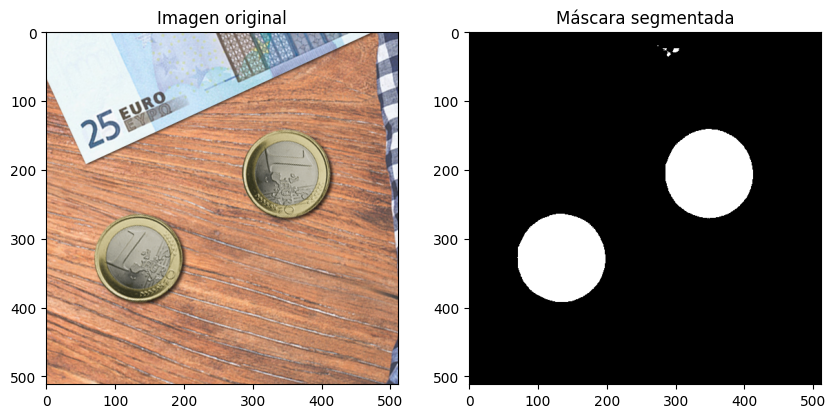

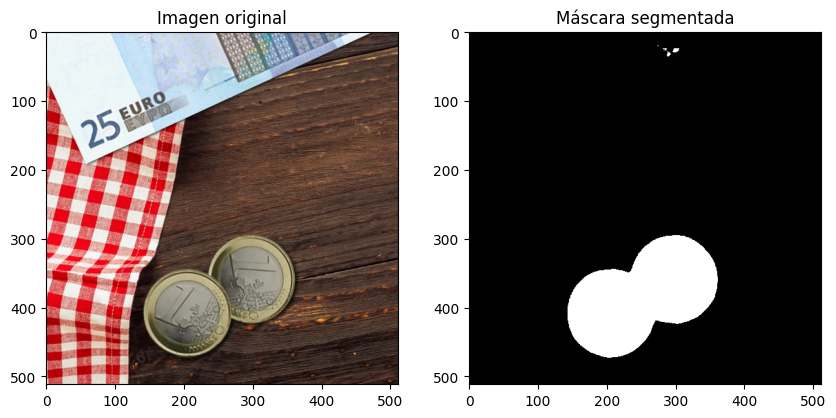

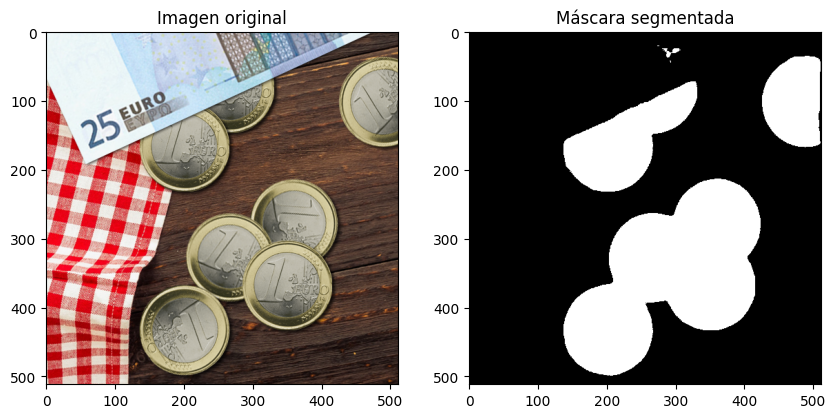


Visualizando resultados del modelo con 2 conexiones 'skip'...


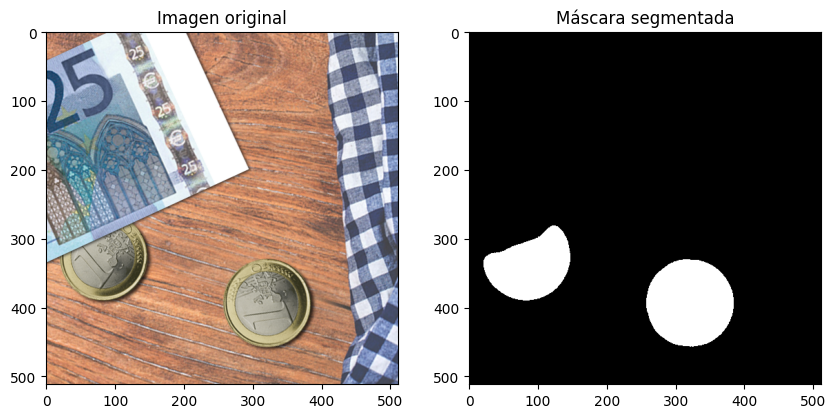

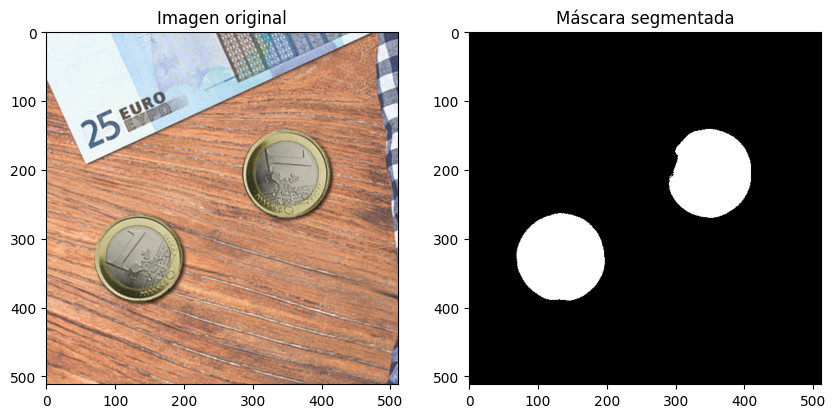

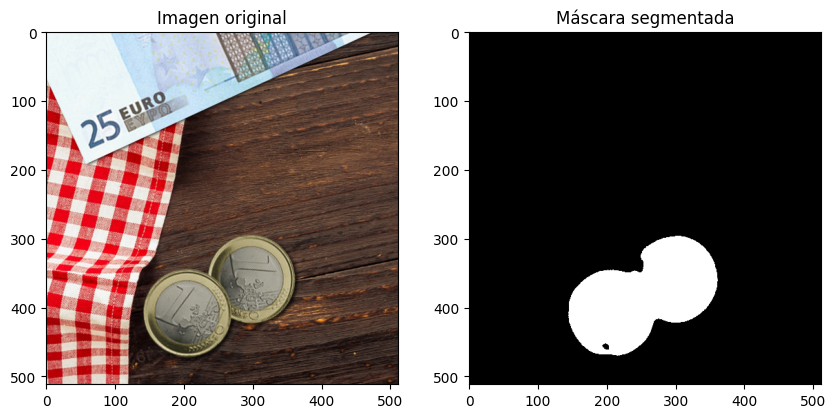

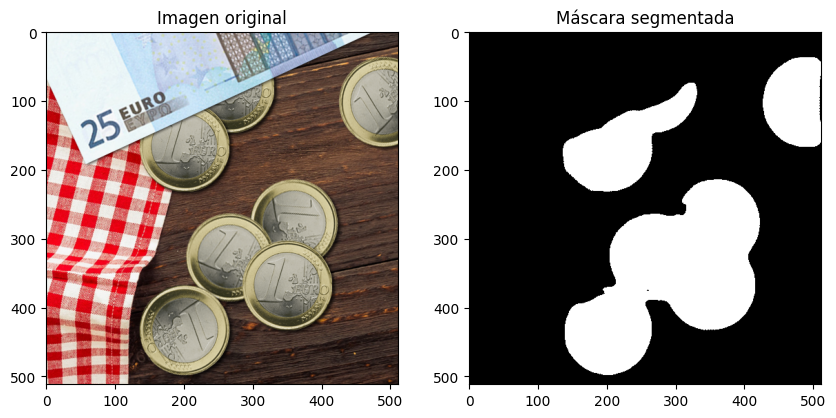


Visualizando resultados del modelo con 1 conexiones 'skip'...


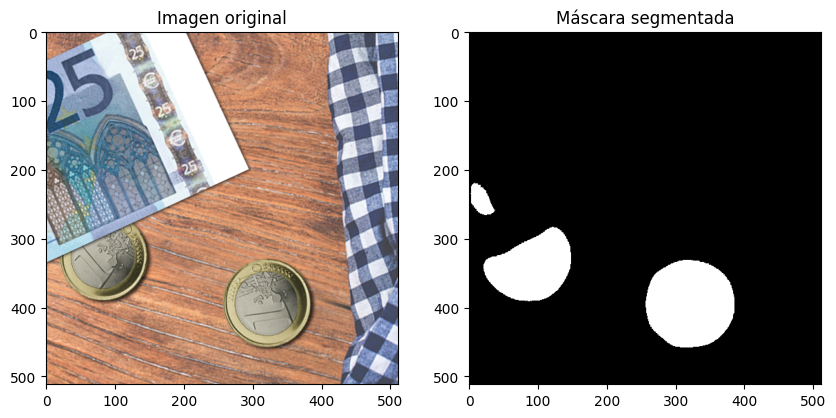

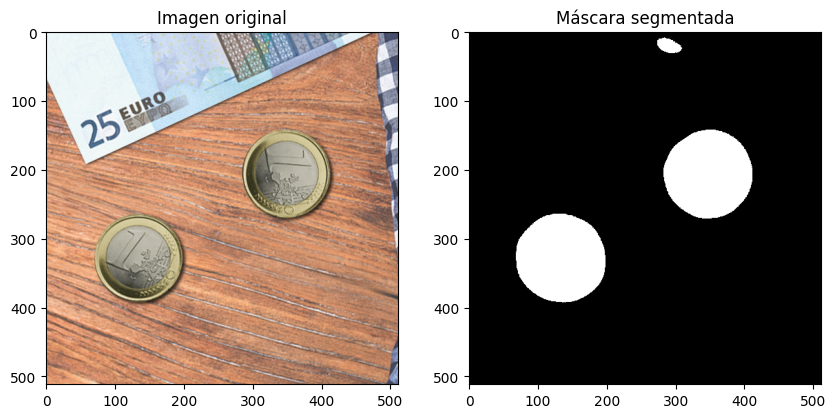

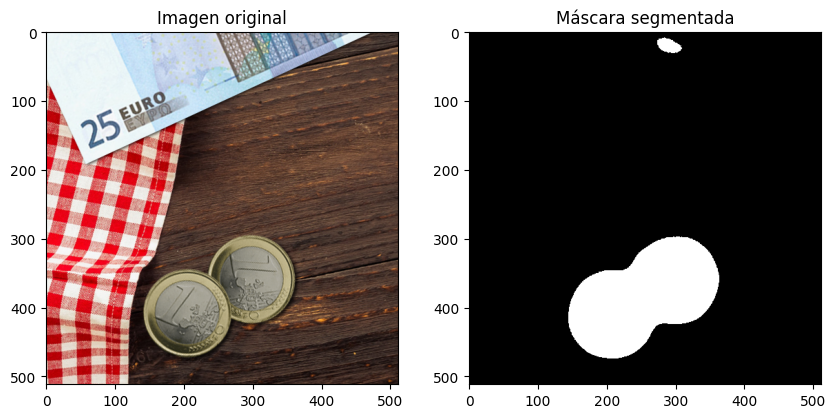

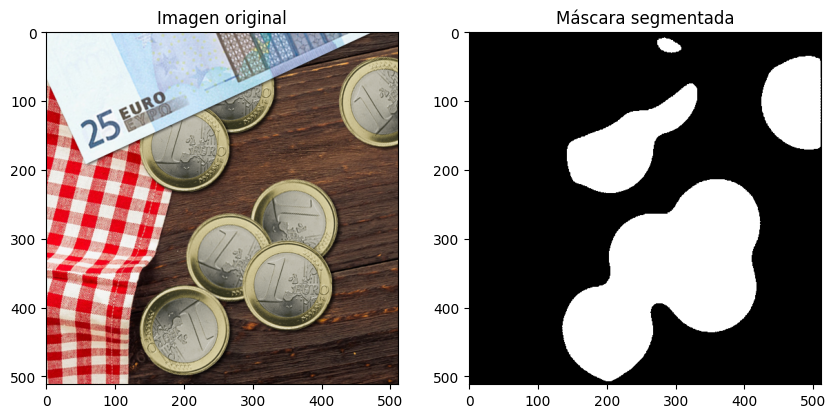


Visualizando resultados del modelo con 0 conexiones 'skip'...


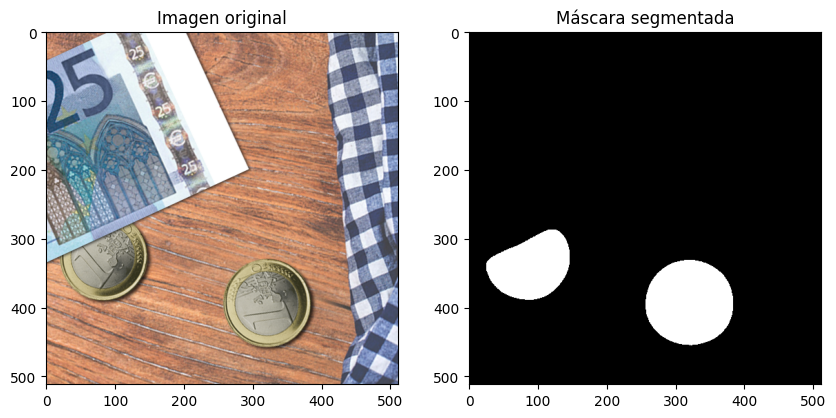

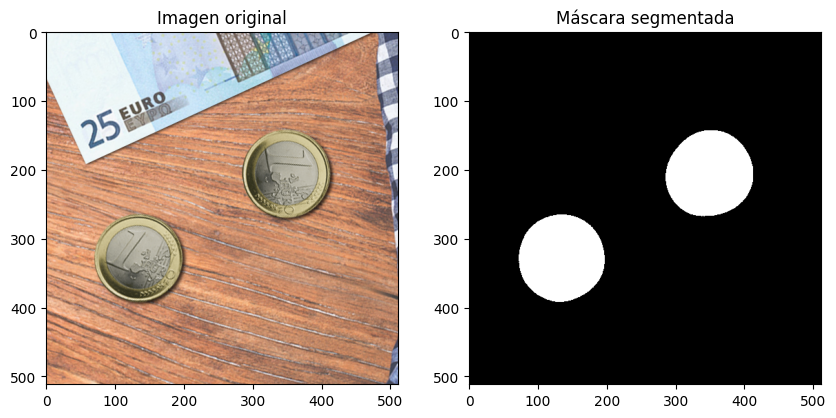

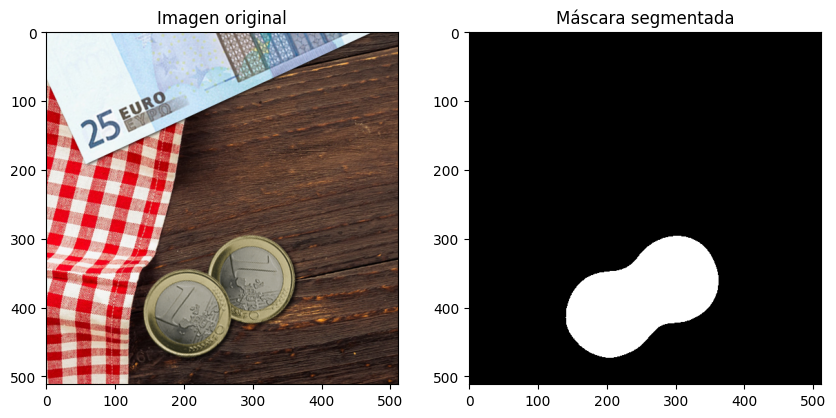

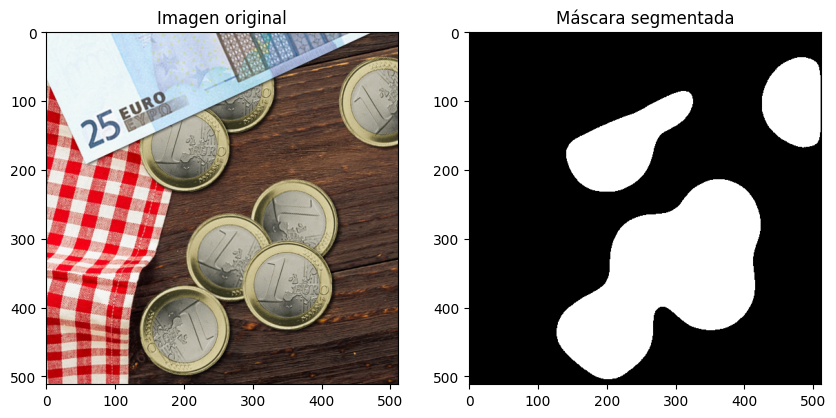

In [7]:
# Visualización de resultados para los modelos guardados
for skip_level in skip_configurations:
    print(f"\nVisualizando resultados del modelo con {skip_level} conexiones 'skip'...")

    # Cargar el modelo guardado
    model_path = f"model_unet_skip_{skip_level}.pth"
    model = build_unet_skip(base_channels=base_channels, skip_connections=skip_level).to(device)
    model.load_state_dict(torch.load(model_path))
    model.eval()

    with torch.no_grad():
        it = iter(test_loader)
        img, label = next(it)
        img = img.to(device)
        ret = model(img)
        ret = torch.round(ret)  # Redondear para obtener 0 o 1 en las máscaras

        # Mostrar imágenes originales y segmentadas
        for j in range(4):  # Mostrar 4 ejemplos
            plt.figure(figsize=(10, 10))
            plt.subplot(1, 2, 1)
            plt.title("Imagen original")
            plt.imshow(img[j].permute(1, 2, 0).cpu().numpy())
            plt.subplot(1, 2, 2)
            plt.title("Máscara segmentada")
            plt.imshow(ret[j][0].cpu().numpy(), cmap='gray')
            plt.show()
